In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pickle
import bs4 as bs
import urllib.request
import nltk
import spacy
import random
import string

In [2]:
base_dados = pd.read_csv("base_treinamento.txt",encoding="utf-8")
base_dados.shape

(196, 2)

In [3]:
base_dados.head()

,texto,emocao
0,este trabalho é agradável,alegria
1,gosto de ficar no seu aconchego,alegria
2,fiz a adesão ao curso hoje,alegria
3,eu sou admirada por muitos,alegria
4,adoro como você,alegria


<Axes: xlabel='count', ylabel='emocao'>

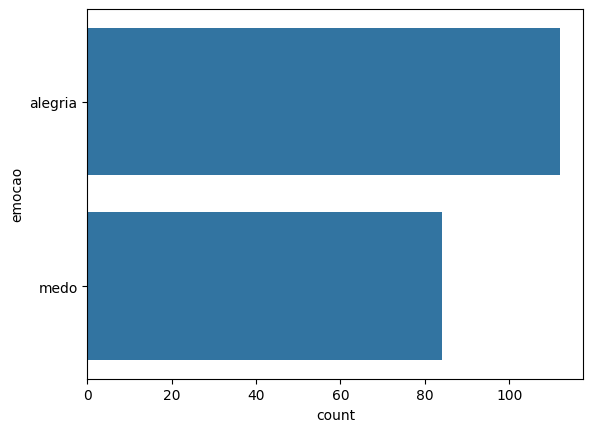

In [4]:
sns.countplot(base_dados["emocao"],label="contagem")

In [5]:
pontuacoes = string.punctuation
pontuacoes

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [6]:
from spacy.lang.pt.stop_words import STOP_WORDS
stop_words = STOP_WORDS

In [7]:
pln = spacy.load("pt_core_news_sm")

In [8]:
def preprocessamento(texto):
    texto = texto.lower()
    documento = pln(texto)
    lista = []
    for token in documento:
        lista.append(token.lemma_)

    lista = [palavra for palavra in lista if palavra not in stop_words and palavra not in pontuacoes]
    lista = " ".join([str(elemento) for elemento in lista if not elemento.isdigit()])

    return lista

In [9]:
teste = preprocessamento("estou aprendendo processamento de linguagem natural,curso em curitiba")
teste

'aprender processamento linguagem natural curso curitber'

In [10]:
base_dados["texto"] = base_dados["texto"].apply(preprocessamento)

In [11]:
base_dados.head()

,texto,emocao
0,trabalho agradável,alegria
1,gostar ficar em o aconchego,alegria
2,fiz adesão a o curso hoje,alegria
3,admirar,alegria
4,adorar,alegria


In [12]:
base_dados_final = []

for texto,emocao in zip(base_dados["texto"],base_dados["emocao"]):
    if emocao == "alegria":
        dic = {"ALEGRIA":True,"MEDO":False}
    elif emocao == "medo":
        dic = {"ALEGRIA":False,"MEDO":True}

    base_dados_final.append([texto,dic.copy()])

In [13]:
base_dados_final[0]

['trabalho agradável', {'ALEGRIA': True, 'MEDO': False}]

In [31]:
from spacy.training import Example

In [35]:
modelo = spacy.blank('pt')
textcat = modelo.add_pipe("textcat")
textcat.add_label("ALEGRIA")
textcat.add_label("MEDO")
historico = []

In [50]:
modelo.begin_training()
for epoca in range(1000):
  random.shuffle(base_dados_final)
  losses = {}
  for batch in spacy.util.minibatch(base_dados_final, 30):
    textos = [modelo(texto) for texto, entities in batch]
    print(textos)
    annotations = [{'cats': entities} for texto, entities in batch]
    print(annotations)
    examples = [Example.from_dict(doc, annotation) for doc, annotation in zip(
            textos, annotations
        )]
    modelo.update(examples, losses=losses)
  if epoca % 100 == 0:
    print(losses)
    historico.append(losses)

[descobrir Deus, completamente apaixonar, compatível, caridoso natal, finalmente colocar amor, aplaudir vencedor, beneficiar por o empresa, pintura brilhante, achar arriscado, aprovar em o exame, amar maravilhoso, luar belo, arrumação terminada alívio, rapaz extremamente atraente, trabalhar equipe, elogio, comediante, calmo dinheiro, dirijar rápido, órgão compatível paciente, escolha, temo sentença de o juiz negativo, engraçado explicar, arrumar emprego junto, apreciar presença escola, amiga companheira, amor abundante, sorrir orelha orelha, desejar, alegr]
[{'cats': {'ALEGRIA': False, 'MEDO': True}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': True, 'MEDO': False}}, {'cats': {'ALEGRIA': False, 'MEDO': True}}, {'cats': {'ALEGRIA': True, 'MEDO': Fals

In [37]:
historico_loss = []
for i in historico:
    historico_loss.append(i.get("textcat"))

In [38]:
historico_loss = np.array(historico_loss)
historico_loss

array([1.71084790e+00, 3.27204347e-11, 4.12050359e-12, 1.16822528e-12,
       3.93772807e-13, 1.67128487e-13, 8.64648043e-14, 4.21770563e-14,
       2.19589111e-14, 1.24186806e-14])

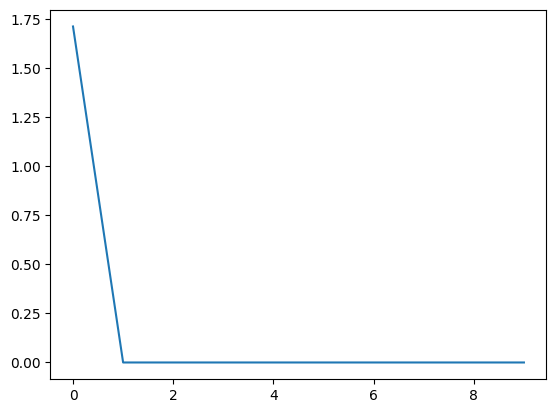

In [39]:
plt.plot(historico_loss)
plt.show()

In [40]:
modelo.to_disk("modelo")

In [41]:
modelo_carregado = spacy.load("modelo")

In [42]:
modelo_carregado

In [44]:
texto_positivo = "eu adoro a cor dos seus olhos"

In [46]:
texto_positivo = preprocessamento(texto_positivo)
texto_positivo

'adorar cor olho'

In [48]:
previsao_p = modelo_carregado(texto_positivo)
previsao_p.cats

{'ALEGRIA': 1.0, 'MEDO': 2.261112008739019e-08}

In [49]:
texto_negativo = "estou com medo dele"
previsao = modelo_carregado(preprocessamento(texto_negativo))
previsao.cats

{'ALEGRIA': 3.209224814781919e-06, 'MEDO': 0.9999967813491821}

In [51]:
previsoes = []
for texto in base_dados["texto"]:
    previsao = modelo_carregado(texto)
    previsoes.append(previsao.cats)

In [52]:
previsoes

[{'ALEGRIA': 1.0, 'MEDO': 1.299500240747875e-08},
 {'ALEGRIA': 0.9999998807907104, 'MEDO': 7.809488522525498e-08},
 {'ALEGRIA': 1.0, 'MEDO': 1.19471952331196e-08},
 {'ALEGRIA': 1.0, 'MEDO': 2.5167144812598963e-08},
 {'ALEGRIA': 1.0, 'MEDO': 3.683356952777217e-09},
 {'ALEGRIA': 1.0, 'MEDO': 2.2519701659007296e-08},
 {'ALEGRIA': 1.0, 'MEDO': 1.9396393824422375e-08},
 {'ALEGRIA': 1.0, 'MEDO': 7.54191820107053e-09},
 {'ALEGRIA': 1.0, 'MEDO': 1.1234274843729963e-08},
 {'ALEGRIA': 0.9999998807907104, 'MEDO': 1.2766652446316584e-07},
 {'ALEGRIA': 1.0, 'MEDO': 5.550834902834367e-09},
 {'ALEGRIA': 1.0, 'MEDO': 1.5509250550493903e-09},
 {'ALEGRIA': 1.0, 'MEDO': 4.658509578092662e-09},
 {'ALEGRIA': 1.0, 'MEDO': 2.0975141623580384e-08},
 {'ALEGRIA': 1.0, 'MEDO': 3.988955654676829e-08},
 {'ALEGRIA': 1.0, 'MEDO': 9.599419925621078e-09},
 {'ALEGRIA': 1.0, 'MEDO': 8.297091014242142e-09},
 {'ALEGRIA': 1.0, 'MEDO': 3.0708169340698532e-09},
 {'ALEGRIA': 1.0, 'MEDO': 6.312009581677103e-09},
 {'ALEGRIA': 1

In [53]:
previsoes_final = []
for previsao in previsoes:
    if previsao["ALEGRIA"] > previsao["MEDO"]:
        previsoes_final.append("alegria")
    else:
        previsoes_final.append("medo")

previsoes_final = np.array(previsoes_final)

In [57]:
respostas_reais = base_dados["emocao"].values

In [58]:
from sklearn.metrics import confusion_matrix,accuracy_score
accuracy_score(respostas_reais,previsoes_final)

1.0

In [59]:
cm = confusion_matrix(respostas_reais,previsoes_final)
cm

array([[112,   0],
       [  0,  84]])

In [1]:
base_dados_teste = pd.read_csv("base_teste.txt",encoding="utf-8")


NameError: name 'pd' is not defined

In [61]:
base_dados_teste["texto"] = base_dados_teste["texto"].apply(preprocessamento)

In [62]:
previsoes_teste = []
for texto in base_dados_teste["texto"]:
    previsao = modelo_carregado(texto)
    previsoes_teste.append(previsao.cats)

In [63]:
previsoes_final_teste = []
for previsao in previsoes_teste:
    if previsao["ALEGRIA"] > previsao["MEDO"]:
        previsoes_final_teste.append("alegria")
    else:
        previsoes_final_teste.append("medo")

previsoes_final_teste = np.array(previsoes_final_teste)

In [65]:
respostas_reais_teste = base_dados_teste["emocao"].values

In [66]:
accuracy_score(respostas_reais_teste,previsoes_final_teste)

0.5952380952380952